# Higher Dimensional Real Life Linear Models

We've had a look at fitting some simple polynomials in 1D. But in astronomy, we often have data that is higher dimensional, for example imaging data, multi-dimensional spectra, or 3D images over time. Let's try fitting some higher dimensional data with these principles.

In [55]:
import lightkurve as lk
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from utils import animate
sns.set_context("talk", font_scale=0.8)

In this case, rather than starting with dummy data, let's grab some real data. This time, we're going to use data from the TESS mission. TESS takes lots of large images of the sky at a rapid cadence, so there's lots of data for us to work with.

<div class="admonition">
<p class="admonition-title">Lightkurve Objects</p>
    <p><code>tpf</code> is a <code>lightkurve</code> object, which you might already know how to work with, and has lots of helpful functions. However, for the purposes of this tutorial, I'm just going to take the time and flux components from this object and work with them as <code>numpy</code> arrays directly. </p>
</div>

In [2]:
tpf = lk.search_tesscut('HAT-P-19', sector=17).download(cutout_size=(15, 14))

In [3]:
x = tpf.time[:300].value
x -= x.mean()
y = tpf.flux[:300].value

In [4]:
y.shape

(300, 15, 14)

We now have flux data that is 3D; it has a time dimension and then two spatial dimensions. Let's take a look at the first frame.

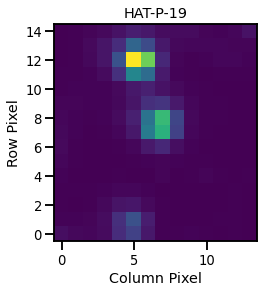

In [5]:
fig, ax = plt.subplots()
plt.imshow(y[0], origin='lower')
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19');

You can see there is a target in the center of the image, and some background targets.

In TESS data there is a lot of scattered background light in the images which causes an additive offset to the data. You can use the widget below to scroll around in the data, you'll see there is an additive background that increases as you move forward through the frames.

In [56]:
animate(y - np.median(y), xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 Data',
        vmin=-20, vmax=20)

Let's build a model that let's us remove the offset from a single frame. Let's assume that a low order, 2D polynomial well describes the background in the image.

But first, let's look at our data again

In [6]:
y.shape

(300, 15, 14)

There are 300 frames. For now, let's just fit one. 

In [7]:
y[0].shape

(15, 14)

If we fit one, the data is still in a high dimensional matrix. We don't want this, we want y to be a 1D vector. That's ok, we'll just reshape it.

In [8]:
y[0].ravel().shape

(210,)

The `ravel` function has flattened our 2D array into a 1D array. Now we can create the design matrix for our model.

In [9]:
R, C = np.mgrid[:y.shape[1], :y.shape[2]]

In [10]:
R, C

(array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1],
        [ 2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2],
        [ 3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3],
        [ 4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4],
        [ 5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5],
        [ 6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6],
        [ 7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7],
        [ 8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8],
        [ 9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9],
        [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
        [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11],
        [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12],
        [13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13],
        [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14]]),
 array([

Above I've made two matrices, one with the row positions `R` and one with the column positions `C`. We'll need to `ravel` these to be the same shape as our flattened data array.

In [11]:
R.ravel(), C.ravel()

(array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  3,
         3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,
         7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
         9,  9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13,
        13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14,
        14, 14, 14, 14, 14, 14]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11

Now, we can use those vectors to build our design matrix. Let's make a very simple model of a 1st order polnomial in 2D:

In [12]:
A = np.vstack([np.ones(210),
            R.ravel(),
            C.ravel(),
            (R*C).ravel()]).T

The design matrix is just:

- An offset term
- Row position
- Column position
- Row * Column position for the cross terms.

Here's a look at the first 5 elements in the design matrix:

In [13]:
A[:5]

array([[1., 0., 0., 0.],
       [1., 0., 1., 0.],
       [1., 0., 2., 0.],
       [1., 0., 3., 0.],
       [1., 0., 4., 0.]])

And you can see from the shape of the design matrix that it has an entry for every pixel, for every vector component in the design matrix:

In [14]:
A.shape

(210, 4)

We have all the components we need, let's fit our model.

In [15]:
w = np.linalg.solve(A.T.dot(A), A.T.dot(y[0].ravel()))

In [16]:
w

array([ 1.12750434e+02,  4.08797544e+00, -9.55572508e-01, -8.15182743e-02])

Great, we've found our best fitting weights! Let's make our model

In [17]:
model = A.dot(w)

In [18]:
model.shape

(210,)

Our model is still in the "unraveled" shape, so let's put it back into a 2D image:

In [19]:
model = A.dot(w).reshape(y.shape[1:])

In [20]:
model.shape

(15, 14)

Great! We've fit our polynomial model to the frame. Let's plot it!

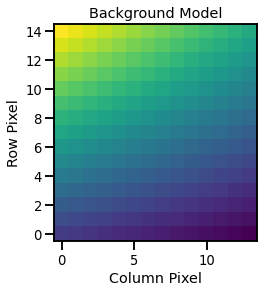

In [21]:
fig, ax = plt.subplots()
plt.imshow(model, origin='lower')
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='Background Model');

Great! We've now fit a smooth model to the image and we could remove this from the data. Let's look at the residuals.

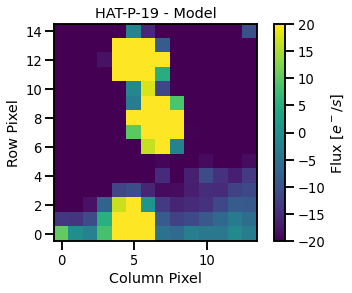

In [22]:
fig, ax = plt.subplots()
im = plt.imshow(y[0] - model, origin='lower', vmin=-20, vmax=20)
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Flux [$e^-/s$]")
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 - Model');

Hm. The background pixels -should- be close to zero, but they are actually large, negative values. What's going on?

Well, we fit our model to -all- the pixels in the image. And those bright targets in the image are actually skewing the fit. The model has no way to fit the bright targets, and so it's fitting the average. This is not what we want. How should we move forward?


## Idea 1: We can mask out bright pixels.

We've got quite a lot of data, and there aren't many stars in the image. We could try masking out the stars in the image and then fit our model. This will ensure we're not being skewed by the bright pixels. Let's try it.


In [23]:
# I've set this by hand looking at the data, as a reasonable pixel mask
# If you're doing this to your own data, think carefully about how to mask it

# Mask is True anywhere where the flux is less than 150
mask = y[0].ravel() < 150

In [24]:
w = np.linalg.solve(A[mask].T.dot(A[mask]),
                    A[mask].T.dot(y[0].ravel()[mask]))

Ok we've found our best fitting weights! Now let's make our model. Remember we're not going to mask the design matrix this time, because we want to know the value of the model at all pixels.

In [25]:
model = A.dot(w).reshape(y.shape[1:])

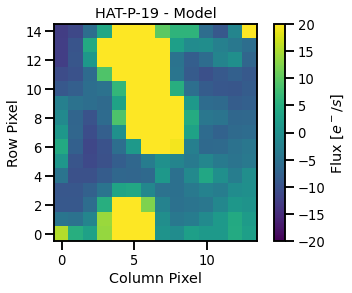

In [26]:
fig, ax = plt.subplots()
im = plt.imshow(y[0] - model, origin='lower', vmin=-20, vmax=20)
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Flux [$e^-/s$]")
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 - Model');

Great! Now the model is fitting only the background pixels, and the value of the background pixels is close to zero!

## Idea 2: We could change our model

What if we don't have enough data that we can afford to mask some of it out? Then we're going to need a better model for the data. Let's update our model so that it can flexibly fit around the stars. 

For this TESS data, we have 300 frames of the same patch of sky, which should have approximately the same star scene, but variable amounts of background.

Let's try a model that is our simple polynomial + the average image over time.

In [27]:
avg = y.mean(axis=0)

In [28]:
avg.shape

(15, 14)

Because the average image still has background in it, I'm going to median subtract the average. 

In [29]:
avg = y.mean(axis=0)
avg -= np.median(avg)

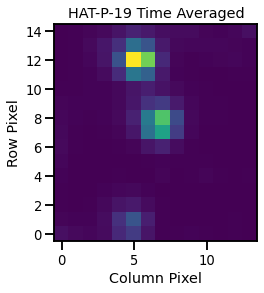

In [30]:
fig, ax = plt.subplots()
plt.imshow(avg, origin='lower')
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 Time Averaged');

We'll need a new design matrix

In [31]:
A = np.vstack([np.ones(210),
            R.ravel(),
            C.ravel(),
            (R*C).ravel(),
            avg.ravel()]).T

In [32]:
A.shape

(210, 5)

Now we have an additional vector which is the average image over time. Let's fit the model again, this time we don't need to mask pixels.

In [33]:
w = np.linalg.solve(A.T.dot(A), A.T.dot(y[0].ravel()))

In [34]:
model = A.dot(w).reshape(y.shape[1:])

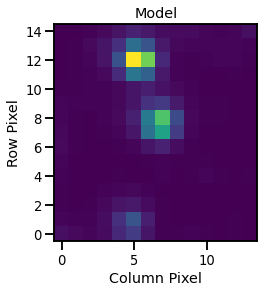

In [35]:
fig, ax = plt.subplots()
plt.imshow(model, origin='lower')
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='Model');

Now our model includes the stars, because we've included the average as one of our matrix components. We wanted to do this to allow the model to flexibly fit the background around the stars, but in our case we only want to use the model for the background.

To achieve this, let's use the weights that are for the polynomial coefficients only. Below I make the model using all but the last components of the design matrix, because the last component is the "average" (see above).

In [36]:
model = A[:, :-1].dot(w[:-1]).reshape(y.shape[1:])

In [37]:
model.shape

(15, 14)

The model still has the same number of pixels.

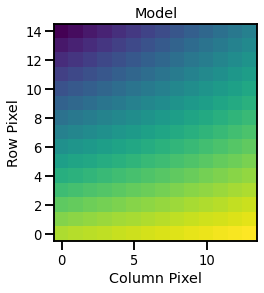

In [38]:
fig, ax = plt.subplots()
plt.imshow(model, origin='lower')
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='Model');

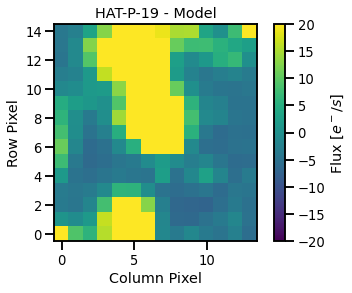

In [39]:
fig, ax = plt.subplots()
im = plt.imshow(y[0] - model, origin='lower', vmin=-20, vmax=20)
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Flux [$e^-/s$]")
ax.set(xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 - Model');

Now we've fit the data and removed the background, without the stars skewing the fit. Great!

## Fitting the same model many times

Now that you've seen we can fit a 2D model to a frame, what if we want to fit the same model to many frames?

We can do that easily, first let's do it by iterating.

In [40]:
%%time
ws = np.asarray([np.linalg.solve(A.T.dot(A), A.T.dot(frame.ravel())) for frame in y])

CPU times: user 4.93 ms, sys: 1.41 ms, total: 6.34 ms
Wall time: 2.88 ms


In [41]:
ws.shape

(300, 5)

Above, I've created weights for every frame in the data. You can see it has shape 300 (number of frames) by 5 (number of components in the model). I've done this by iterating over every frame.

Let's make the model for all of these frames. (Remember, we're only using the first 4 components, because we don't want to include the average.)


In [42]:
model = np.asarray([A[:, :-1].dot(w[:-1]).reshape(y.shape[1:]) for w in ws])

In [43]:
model.shape

(300, 15, 14)

We've made a model with the same shape as the data. Let's look at the data. Below is a widget you can slide to look at the data and the model we've built.

In [53]:
animate(y - np.median(y), xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 Data',
        vmin=-20, vmax=20)

In [52]:
animate(model - np.median(model), xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 Model', 
       vmin=-20, vmax=20)

Let's look at the residuals between the data and the model.

In [54]:
animate(y - model, xlabel='Column Pixel', ylabel='Row Pixel', title='HAT-P-19 Data',
        vmin=-20, vmax=20)

You can see that we've now removed the changing background! This is excellent, and exactly what we were trying to achieve.


<div class="admonition">
<p class="admonition-title">Motion in TESS Images</p>
    <p> Keen readers will have spotted that while the additive background has been removed, the targets in the image still appear to "move". This is a known feature of TESS and Kepler data known as "velocity aberration", and here we're not trying to address that feature. However, in future notebooks, we'll look more at that. </p>
</div>

Now that we've fit our high dimensional model, how would we go further? Well in this case we only used a small subset of the data, so we could increase the dataset by adding more pixels around our target, and including more frames. 

<div class="admonition caution">
<p class="admonition-title">Watch out for Overfitting</p>
    <p> It's important whenever we're building these models to watch for overfitting. But, when you start adding in very high dimensional data, you should be even more careful, because it's easy to get confused with all the different shapes and dimensions. In the case above, we're fitting 5 vectors to 210 pixels in any given frame, so we're probably not in too much danger of overfitting. If we were trying to fit 10 vectors to 15 pixels, we'd be in danger.</p>
</div>

In the above example, we looked at how we could fit a 2D polynomial to every frame. We could keep going, and if we wanted to, we could try fitting a 3D polynomial. Why not go higher? Well there are a few things to consider. 

1. **In this instance, a 3D polynomial is not a very good approximation.** We can use our astronomy knowledge of TESS data to know that the background in this instance is not smoothly varying in time, and so it isn't a good model in this instance
2. **Increasing to a 3D polynomial will greatly increase the number of pixels we're fitting** At the moment we are fitting 5 components to 210 pixels, which is a very cheap linear algebra problem to solve with modern computing. However, if you want to fit 300 frames of 210 pixels, you're fitting 63,000 individual datapoints, and depending on your polynomial orders you may be fitting with tens of vectors. This is probably actually still tractable on most modern computers in well under a second, but as you increase the number of datapoints you fit, you'll start to find the computation is slow. If you push it even further, you'll start to find you run out of memory.

Fitting a 3D model to this data which accounts for variability in space and time dimensions is possible and useful, but we'll leave it for and move on to some more examples.

<div class="admonition">
<p class="admonition-title">The Take Aways</p>
    <p> In this notebook you should have seen that <ul>
    <li>1) It's possible and easy to build high dimensional simple linear algebra models </li>
    <li>2) When you have large outliers in your data you can either mask them out, or include them as part of your model. If you don't do this, your model will be wrong! </li>
</div>